# A Walkthrough of "Molecular and immune signatures, and pathological trajectories of fatal COVID-19 lungs defined by in situ spatial single-cell transcriptome analysis".

Das et al. 2023: https://onlinelibrary.wiley.com/doi/10.1002/jmv.29009

```
Arun Das
Postdoctoral Associate
Hillman Cancer Center
University of Pittsburgh Medical Center
```

## Import packages

In [ ]:
%matplotlib inline
import warnings
# Suppress all warnings
warnings.filterwarnings('ignore')

import os
import sys

from datetime import datetime
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.spatial as spatial
import seaborn as sns
import statsmodels
from matplotlib.collections import LineCollection
from scipy.stats import mannwhitneyu
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import KernelDensity, KNeighborsClassifier
from statsmodels.stats import multitest

import matplotlib.cm as cm
import pathlib
from matplotlib.pyplot import figure
from mpl_toolkits.axes_grid1 import make_axes_locatable


import geopandas as gpd
import esda
import libpysal
import matplotlib.pyplot as plt
from splot.esda import plot_local_autocorrelation

from splot._viz_utils import mask_local_auto, moran_hot_cold_spots, splot_colors
from matplotlib import colors

## Define some helper functions

In [22]:
def scatter_df(df, x='x', y='y', c='k', s=[1], figsize=(14,14), cmap=None, 
               dpi = 140, show_axis=False, ax=None, title=None, marker='o', alpha=1.0, label="",
              flip_y=False, flip_x=False, hue=None, vmin=None, vmax=None):

    """
    This is a helper function for the scatter plot.
    """
    
    dfc = df.copy()
        
    with mpl.rc_context({'figure.dpi':dpi, 'savefig.dpi':dpi, "figure.figsize":figsize}):
        
        if not ax:
            f, ax = plt.subplots(figsize=figsize)

        if flip_y:
            dfc[y] = -dfc[y]

        if flip_x:
            dfc[x] = -dfc[x]
            
        if hue:
            ax.scatter(dfc[x].to_numpy(), dfc[y].to_numpy(), c=dfc[hue], s=s, cmap=cmap, marker=marker, alpha=alpha, label=label, vmin=None, vmax=None)
        else:
            ax.scatter(dfc[x].to_numpy(), dfc[y].to_numpy(), c=c, s=s, cmap=cmap, marker=marker, alpha=alpha, label=label, vmin=None, vmax=None)
        
        if not show_axis:
            plt.axis('off')
        if title:
            plt.title(title)

        plt.tight_layout()

        plt.show()
    return ax

In [4]:
def spatial_neighborhood_density(cell_locations_df, x='x', y='y', gene=None, radius = 200.0, leafsize=10000, figsize=(14,14), fontsize=9, cmap='Reds', dpi=100, show_axis=True, return_results=True, kde=False, kde_levels=10, nlargest= 500, min_samples=10, cluster_color='red',s=1, marker='o'):
    """
    This function calculates the density of individual cells in the spatial dataset and optionally returns the density vector [:return(neighbors, frequency, ax)]. **The function is not optimized for performance.
    """
    tree = spatial.KDTree(cell_locations_df[[x,y]].to_numpy(), leafsize=5000)
    neighbors = tree.query_ball_tree(tree, radius)
    frequency = np.array([len(i) for i in neighbors])
    # density = frequency/radius**2
    plt.rcParams["font.size"]=fontsize
    
    if gene:
        gene_expression = cell_locations_df[gene]
        ax = scatter_df(cell_locations_df,  x=x, y=y, figsize=figsize, c=np.multiply(frequency, gene_expression), cmap=cmap, dpi=dpi, s=s, marker=marker,show_axis=show_axis)
        if return_results:
            return(neighbors, frequency, gene_expression)
    else:
        ax = scatter_df(cell_locations_df, x=x, y=y, figsize=figsize, c=frequency, cmap=cmap, dpi=dpi, marker=marker, show_axis=show_axis, s=s)
        
        if kde:
            kdeplot_out = sns.kdeplot(data=cell_locations_df, x=x, y=y, ax=ax, levels=kde_levels, shade=True, cmap='viridis', alpha=0.35, c=frequency)
            kdedata = []
            for i in kdeplot_out.get_children():
                if i.__class__.__name__ == 'LineCollection':
                    kdedata.append(i.get_paths())
        
        if return_results:
            return(neighbors, frequency, ax)

In [53]:


def lisa_cluster(
    moran_loc, gdf, p=0.05, ax=None, legend=True, legend_kwds=None, two_category=True, **kwargs
):
    """
    Create a LISA Cluster map

    Parameters
    ----------
    moran_loc : esda.moran.Moran_Local or Moran_Local_BV instance
        Values of Moran's Local Autocorrelation Statistic
    gdf : geopandas dataframe instance
        The Dataframe containing information to plot. Note that `gdf` will be
        modified, so calling functions should use a copy of the user
        provided `gdf`. (either using gdf.assign() or gdf.copy())
    p : float, optional
        The p-value threshold for significance. Points will
        be colored by significance.
    ax : matplotlib Axes instance, optional
        Axes in which to plot the figure in multiple Axes layout.
        Default = None
    legend : boolean, optional
        If True, legend for maps will be depicted. Default = True
    legend_kwds : dict, optional
        Dictionary to control legend formatting options. Example:
        ``legend_kwds={'loc': 'upper left', 'bbox_to_anchor': (0.92, 1.05)}``
        Default = None
    **kwargs : keyword arguments, optional
        Keywords designing and passed to geopandas.GeoDataFrame.plot().

    Returns
    -------
    fig : matplotlip Figure instance
        Figure of LISA cluster map
    ax : matplotlib Axes instance
        Axes in which the figure is plotted

    Examples
    --------
    Imports

    >>> import matplotlib.pyplot as plt
    >>> from libpysal.weights.contiguity import Queen
    >>> from libpysal import examples
    >>> import geopandas as gpd
    >>> from esda.moran import Moran_Local
    >>> from splot.esda import lisa_cluster

    Data preparation and statistical analysis

    >>> guerry = examples.load_example('Guerry')
    >>> link_to_data = guerry.get_path('guerry.shp')
    >>> gdf = gpd.read_file(link_to_data)
    >>> y = gdf['Donatns'].values
    >>> w = Queen.from_dataframe(gdf)
    >>> w.transform = 'r'
    >>> moran_loc = Moran_Local(y, w)

    Plotting

    >>> fig = lisa_cluster(moran_loc, gdf)
    >>> plt.show()

    """
    # retrieve colors5 and labels from mask_local_auto
    _, colors5, _, labels = mask_local_auto(moran_loc, p=p)
    
    if two_category:
        
        replace_labels = {'ns':'ns',
                 'LL':'LL',
                  'LH':'ns',
                 'HL':'ns',
                  'HH':'HH'
                 }
        labels = [replace_labels[each] for each in labels]
        colors5.pop(1)
        
    # define ListedColormap
    hmap = colors.ListedColormap(colors5)

    if ax is None:
        figsize = kwargs.pop("figsize", None)
        fig, ax = plt.subplots(1, figsize=figsize)
    else:
        fig = ax.get_figure()

    # check for Polygon, else no edgecolor
    if gdf.geom_type.isin(["Polygon", "MultiPolygon"]).any():
        gdf.assign(cl=labels).plot(
            column="cl",
            categorical=True,
            k=2,
            cmap=hmap,
            linewidth=0.1,
            ax=ax,
            edgecolor="white",
            legend=legend,
            legend_kwds=legend_kwds,
            **kwargs
        )
    else:
        gdf.assign(cl=labels).plot(
            column="cl",
            categorical=True,
            k=2,
            cmap=hmap,
            linewidth=1.5,
            ax=ax,
            legend=legend,
            legend_kwds=legend_kwds,
            **kwargs
        )
    ax.set_axis_off()
    ax.set_aspect("equal")
    return fig, ax

# Load the dataset

In [54]:
df = pd.read_csv('tutorial_data/covid_data/COVID-19-tissue-1-2C.csv')

In [55]:
df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,nCount_RNA,nFeature_RNA,orig.ident,nCount_SCT,nFeature_SCT,SCT_snn_res.0.4,seurat_clusters,...,LISA_I_n_COVID_CD209,LISA_CL_n_COVID_CD209,LISA_P_n_COVID_CD209,LISA_I_n_COVID_ACE2,LISA_CL_n_COVID_ACE2,LISA_P_n_COVID_ACE2,n_CSF3_CSF3R.1,LISA_I_n_COVID_n_CSF3_CSF3R,LISA_CL_n_COVID_n_CSF3_CSF3R,LISA_P_n_COVID_n_CSF3_CSF3R
0,0,0,0,19,5,X1,7,3,7,7,...,0.841206,0,0.066,0.743863,0,0.095,0,0.240132,0,0.281
1,1,1,1,6,4,X2,6,4,1,1,...,1.069512,2,0.019,0.743863,0,0.095,0,0.240132,0,0.254
2,2,2,2,7,4,X4,7,4,5,5,...,0.714369,0,0.081,0.743863,2,0.046,0,0.240132,0,0.346
3,3,3,3,7,4,X5,7,4,8,8,...,0.545494,2,0.003,0.379400,0,0.061,0,0.122477,0,0.323
4,4,4,4,7,6,X7,7,6,11,11,...,0.545494,2,0.012,0.379400,0,0.099,0,0.122477,0,0.257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67696,67696,67696,67696,5,5,X136881,6,5,17,17,...,0.482957,0,0.381,-3.990363,3,0.001,0,0.269545,0,0.182
67697,67697,67697,67697,5,4,X136895,6,4,8,8,...,-0.150011,0,0.401,3.412148,1,0.001,0,-0.230487,4,0.001
67698,67698,67698,67698,5,5,X136971,6,5,15,15,...,0.414490,2,0.048,0.288285,0,0.173,0,0.093063,0,0.198
67699,67699,67699,67699,6,5,X137012,6,5,12,12,...,-0.063197,0,0.382,0.652747,0,0.098,0,0.210718,0,0.288


In [56]:
df.columns

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'nCount_RNA',
       'nFeature_RNA', 'orig.ident', 'nCount_SCT', 'nFeature_SCT',
       'SCT_snn_res.0.4', 'seurat_clusters',
       ...
       'LISA_I_n_COVID_CD209', 'LISA_CL_n_COVID_CD209', 'LISA_P_n_COVID_CD209',
       'LISA_I_n_COVID_ACE2', 'LISA_CL_n_COVID_ACE2', 'LISA_P_n_COVID_ACE2',
       'n_CSF3_CSF3R.1', 'LISA_I_n_COVID_n_CSF3_CSF3R',
       'LISA_CL_n_COVID_n_CSF3_CSF3R', 'LISA_P_n_COVID_n_CSF3_CSF3R'],
      dtype='object', length=1545)

In [9]:
df.columns[5:25]

Index(['orig.ident', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4',
       'seurat_clusters', 'cell_type', 'infection', 'cell', 'x', 'y', 'umap_1',
       'umap_2', 'cell_density', 'n_Alveolar', 'n_B', 'n_Basal', 'n_Brush',
       'n_Ciliated', 'n_Dendritic', 'n_Epithelial'],
      dtype='object')

# Let's explore the dataset together!

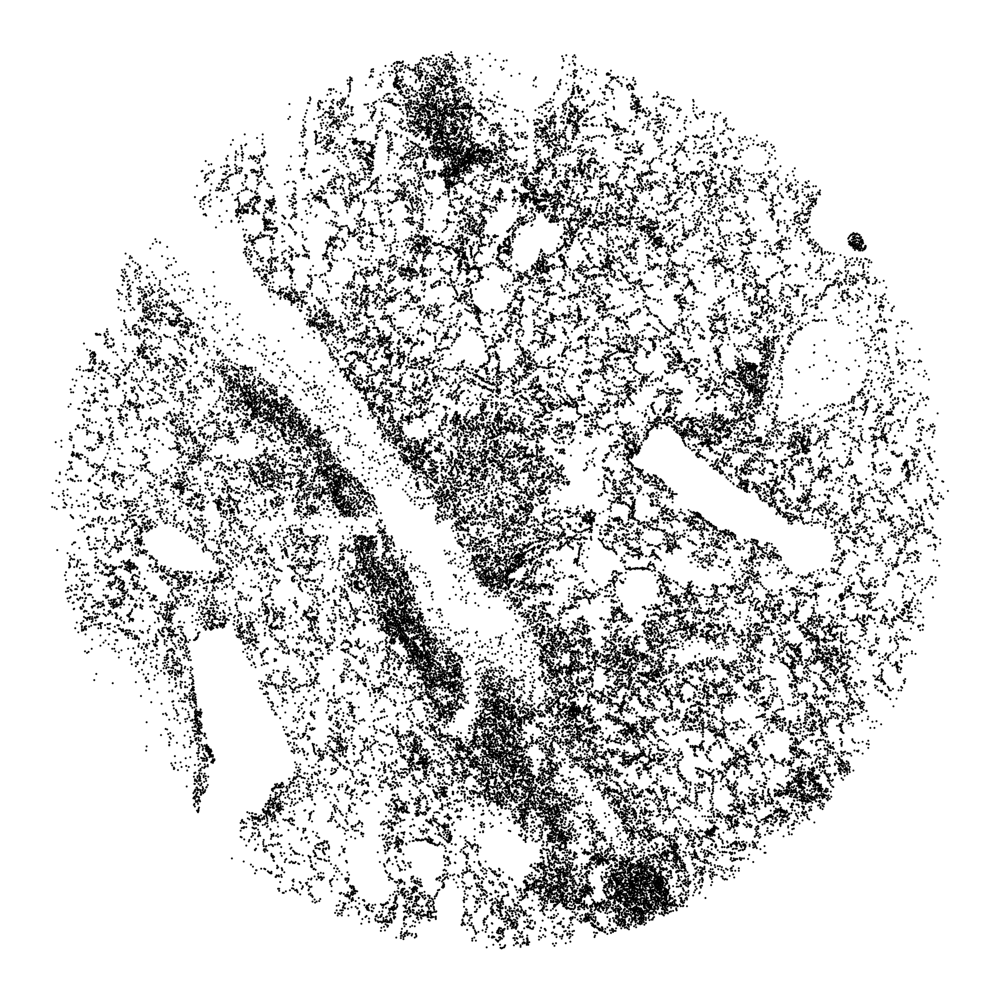

In [23]:
ax = scatter_df(df, flip_y = True)

## Spatial Plot of Cell Density

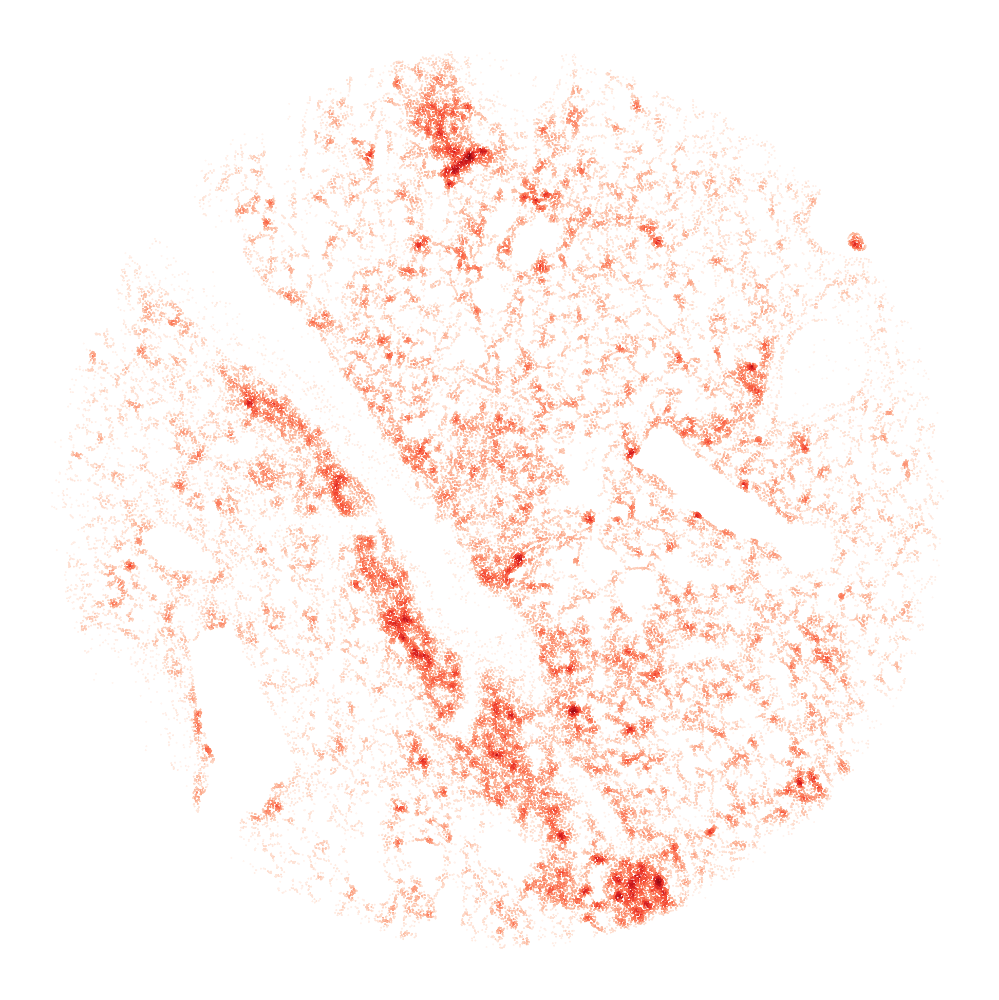

In [25]:
ax = scatter_df(df, hue='cell_density', flip_y=True, cmap='Reds')

## Spatial Maps of Cell Types

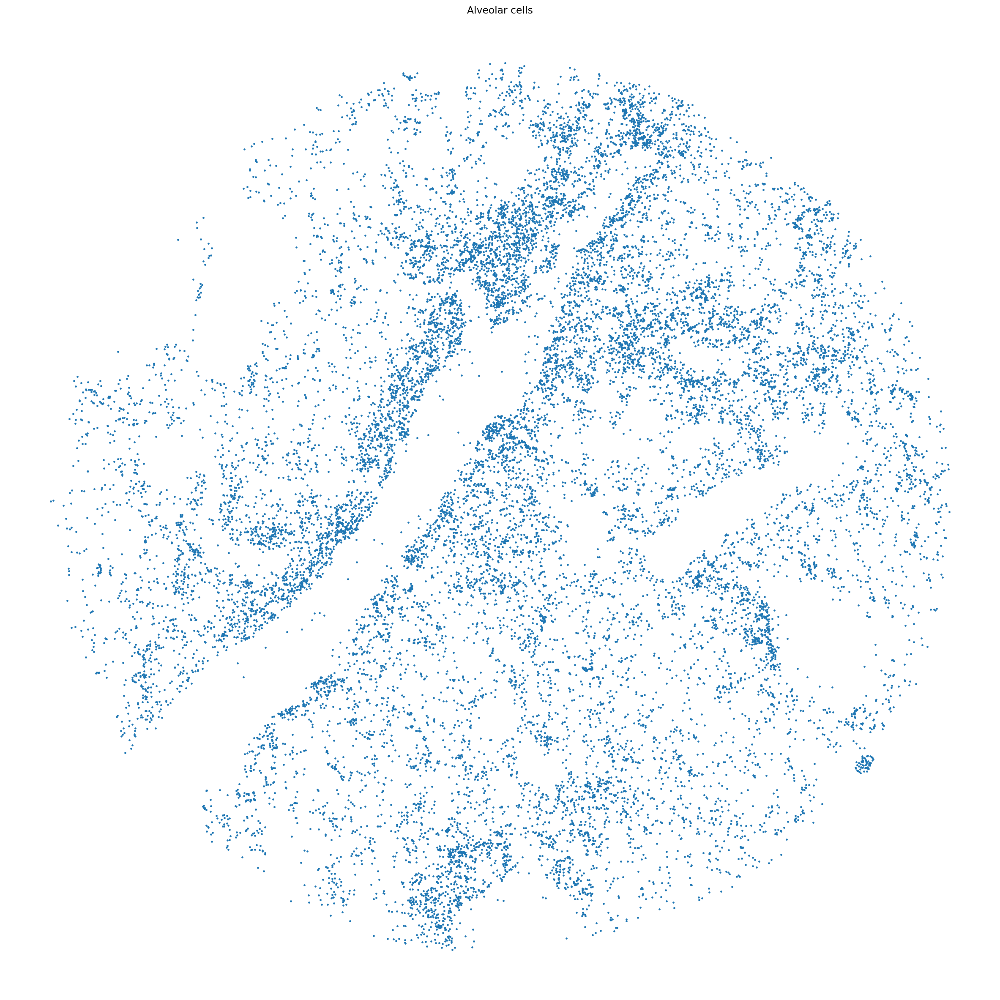

In [34]:
# same color scheme across the manuscript.
color_dict = {'Alveolar cells': '#1f77b4',
 'B cells': '#aec7e8',
 'Basal cells': '#ff7f0e',
 'Brush cells': '#ffbb78',
 'Ciliated cells': '#2ca02c',
 'Dendritic cells': '#98df8a',
 'Epithelial cells': '#d62728',
 'Erythrocyte': '#ff9896',
 'Fibroblasts': '#9467bd',
 'Granulocytes': '#c5b0d5',
 'Ionocytes': '#8c564b',
 'Lymphatic endothelial cells': '#c49c94',
 'Macrophages and monocytes': '#e377c2',
 'Mesothelial cells': '#f7b6d2',
 'NK cells': '#7f7f7f',
 'Smooth muscle cells': '#c7c7c7',
 'T cells': '#bcbd22',
 'Vascular endothelial cells': '#dbdb8d'}

celltype_list = df.cell_type.unique()
celltype_list = sorted(celltype_list)

cell_type = 'Alveolar cells'
cells = df.query(f"cell_type in ['{cell_type}']")
ax = scatter_df(cells, figsize=(17,17), c=color_dict[cell_type], show_axis=False, s=2, title=f"{cell_type}")
plt.show()


In [ ]:
## Spatial Neighborhood Composition Plots

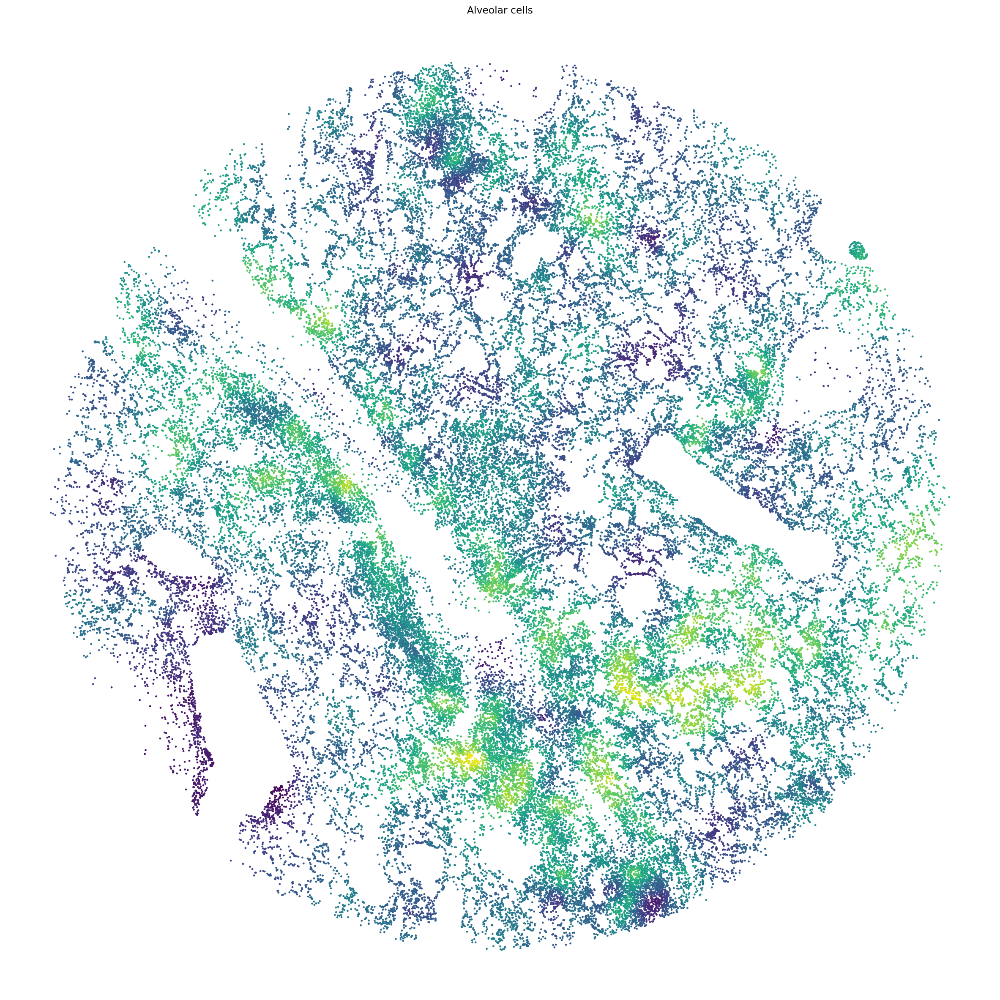

In [38]:
cell_type = 'Alveolar cells'
hue = 'n_' + cell_type.split(' ')[0]
ax = scatter_df(df, figsize=(17,17), hue=hue, flip_y=True, s=2, title=f"{cell_type}")
plt.show()


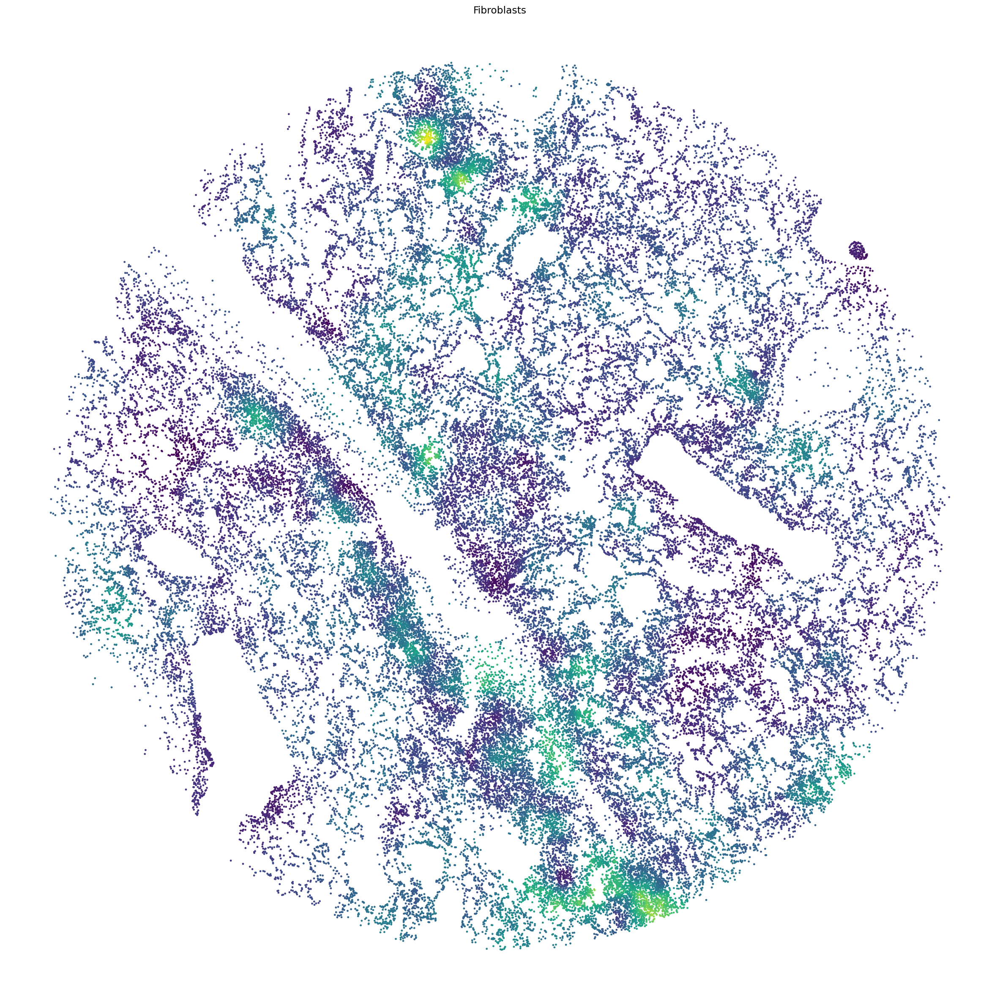

In [39]:
cell_type = 'Fibroblasts'
hue = 'n_' + cell_type.split(' ')[0]
ax = scatter_df(df, figsize=(17,17), hue=hue, flip_y=True, s=2, title=f"{cell_type}")
plt.show()


## Spatial Correlation Analysis

C:\Users\ard212.PITT\AppData\Local\Temp\ipykernel_35020\3982001825.py:6: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = libpysal.weights.Queen.from_dataframe(gdf)


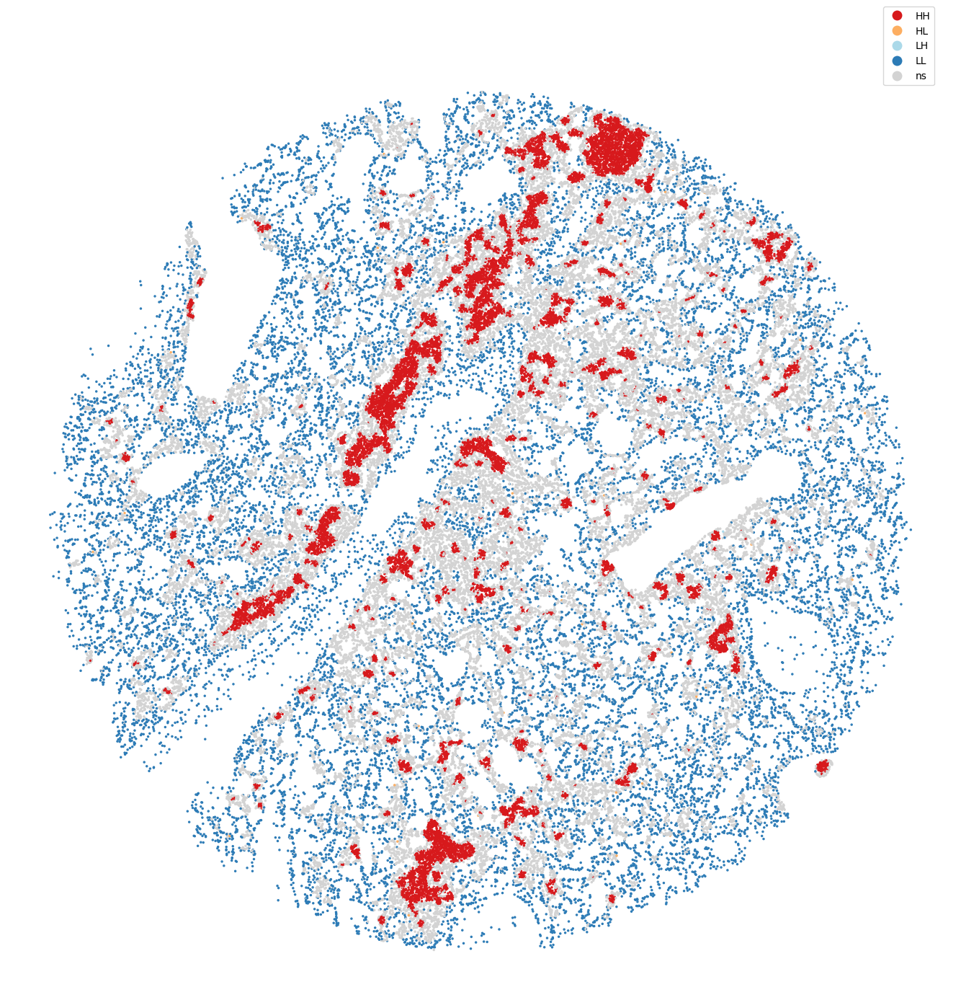

In [58]:
# Create a GeoDataFrame from the DataFrame using x and y columns
geometry = gpd.points_from_xy(df['x'], df['y'])
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Calculate queen contiguity weights
w = libpysal.weights.Queen.from_dataframe(gdf)

# Convert the infection column to a numpy array
study_var = np.array(df["cell_density"])

# Perform LISA analysis
lisa = esda.Moran_Local(study_var, w)

lisa_cluster(
    lisa,
    gdf,
    p=0.05,
    legend=True,
    legend_kwds={"loc": "upper left", "bbox_to_anchor": (0.92, 1.05)},
    s=1,
    figsize=(17,17),
    two_category=False
)

plt.show()